import pandas as pd
# ^^^ pyforest auto-imports - don't write above this line
# Keras Regression

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
# %matplotlib notebook
plt.rcParams["figure.figsize"] = (12,6)
# plt.rcParams['figure.dpi'] = 100
sns.set_style("whitegrid")
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

pd.options.display.max_rows = 100
pd.options.display.max_columns = 100

In [2]:
#!pip install folium 

In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

In [4]:
#df = pd.read_csv("drive/MyDrive/Colab_Files/data/kc_house_data.csv")

In [5]:
#from matplotlib import style
#style.use('dark_background')

In [191]:
df = pd.read_csv("kc_house_data.csv")

- ilk başta veri ile çok uğraşmadan modele gitmek çokça kullanılan bir yöntem
- model ihtiyacı karşılayacak bir skor verebilir

## Exploratory Data Analysis and Visualization

In [192]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [193]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [194]:
df.isnull().sum().any()

False

In [195]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


In [196]:
df.shape

(21597, 21)

### İd_number

In [197]:
df = df.drop('id', axis = 1)

### price

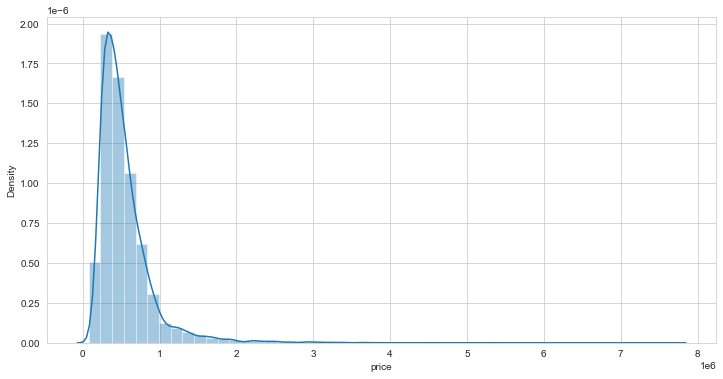

In [205]:
sns.distplot(df['price']);

In [204]:
df[df["price"] > 3000000]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
300,6/24/2014,3080000.000,4,5.000,4550,18641,1.000,1,4,3,10,2600,1950,2002,0,98074,47.605,-122.077,4550,19508
656,11/20/2014,3070000.000,3,2.500,3930,55867,1.000,1,4,4,8,2330,1600,1957,0,98034,47.702,-122.224,2730,26324
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
2083,11/14/2014,3850000.000,4,4.250,5770,21300,2.000,1,4,4,11,5770,0,1980,0,98040,47.585,-122.222,4620,22748
2442,12/10/2014,3280000.000,2,1.750,6840,10000,2.500,1,4,3,11,4350,2490,2001,0,98008,47.604,-122.112,3120,12300
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
2862,11/18/2014,3600000.000,3,3.250,5020,12431,2.000,1,4,3,10,3420,1600,1941,2002,98144,47.593,-122.287,3680,12620
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449


In [11]:
df.groupby("waterfront").mean().T

waterfront,0,1
price,531762.324,1662524.184
bedrooms,3.374,3.301
bathrooms,2.112,2.678
sqft_living,2072.007,3173.687
sqft_lot,15021.290,25371.828
floors,1.493,1.641
view,0.207,3.767
condition,3.409,3.534
grade,7.649,8.773
sqft_above,1783.392,2473.043


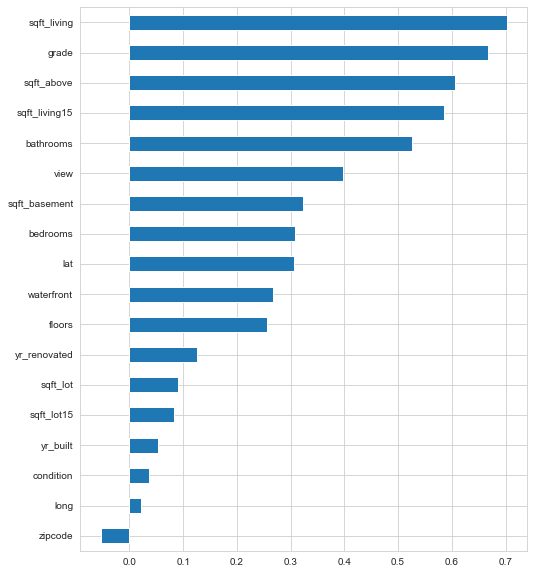

In [206]:
plt.figure(figsize = (8,10))
df.corr()["price"].sort_values().drop("price").plot(kind = "barh");

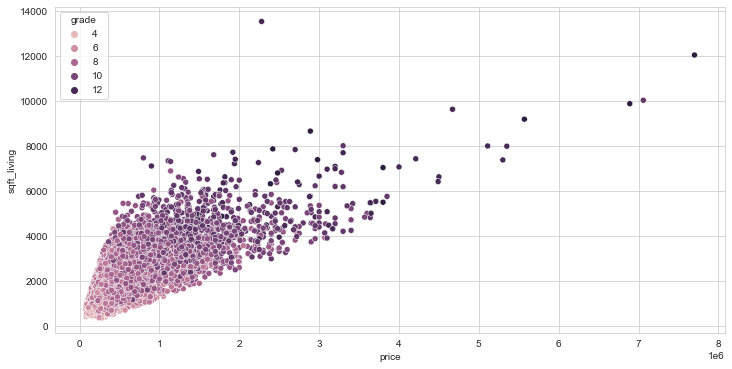

In [13]:
sns.scatterplot(x = 'price',y = 'sqft_living', data = df, hue = "grade");

### bedrooms

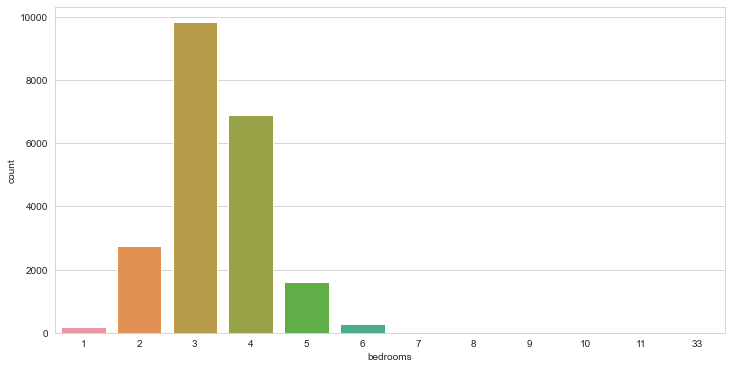

In [207]:
sns.countplot(df['bedrooms']);

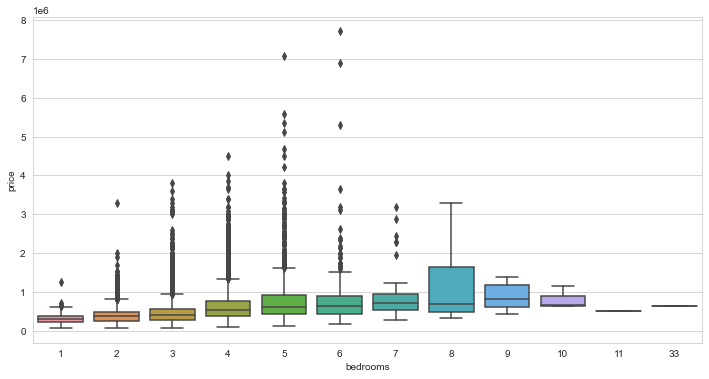

In [208]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);

In [209]:
df[df["bedrooms"] > 10]

# oda sayısı 10 dan büyük olanlara baktım. 33 odalı evin 1.75 banyosu var. bu evin yanlış olarak girildiğini düşünüyorum. 
# onu düşüreceğim.

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [212]:
df = df[df["bedrooms"] != 33]

# 33 odalı olanı dışarda bırakarak onu düşürmüş oldum.

Most likely the data was entered incorrectly.

In [211]:
df.shape

(21596, 20)

### date

In [213]:
df['date'].dtype

dtype('O')

In [214]:
df['date'] = pd.to_datetime(df['date'])

In [215]:
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [216]:
df['year'] = df['date'].apply(lambda date : date.year)

In [217]:
df['month'] = df['date'].apply(lambda date : date.month)

In [218]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


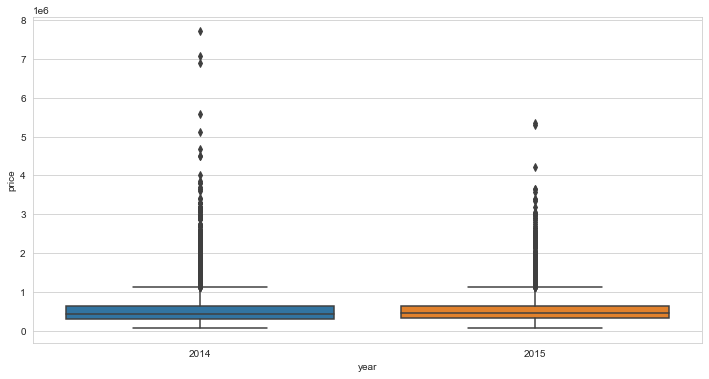

In [219]:
sns.boxplot(x = 'year', y = 'price', data = df);

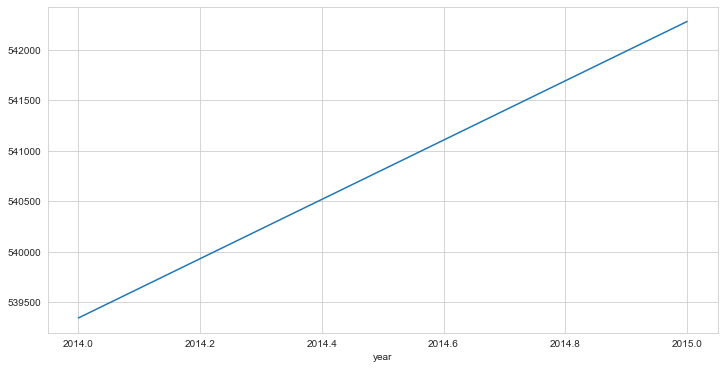

In [220]:
df.groupby('year')['price'].mean().plot();

In [221]:
# 2014 ile 2015 yıllarının ortalama fiyatları ve boxplotu arasında bir fark gözükmüyor. 
# dolayısıyla bir önceki yıla göre fiyatlarda değişim olmamış.

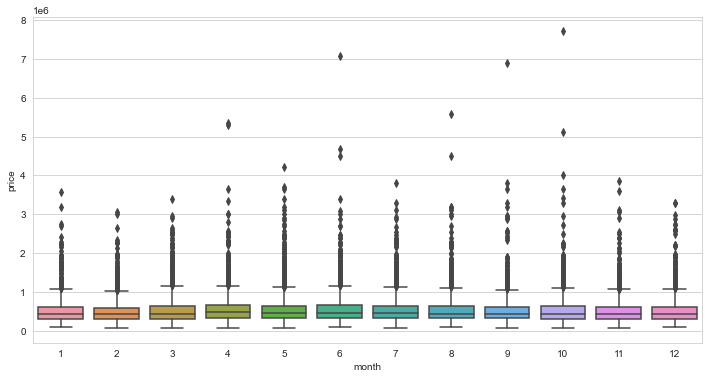

In [27]:
sns.boxplot(x = 'month', y = 'price', data = df);

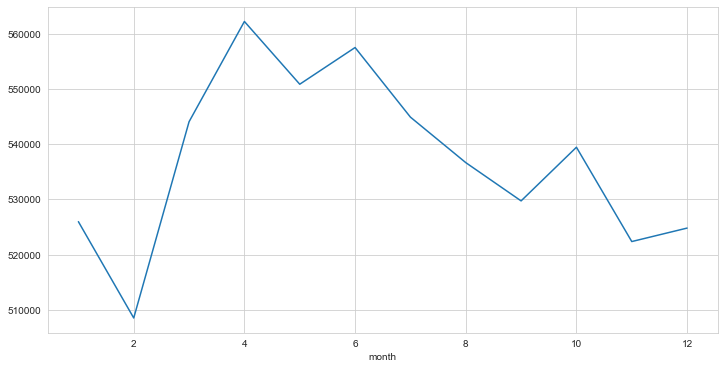

In [28]:
df.groupby('month')['price'].mean().plot();

In [224]:
month_dummy = pd.get_dummies(df["month"], prefix = "month")
df = pd.concat([df, month_dummy], axis = 1)
df.head()

# ayların (0,1,2,3,4...12) bu şekilde kalması aralarında bir ordinal durum oluşturacağı 
# ve ben bunu istemediğim için bunu get_dummies yaparak 0 ve 1 durumuna çevirdim.

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10,0,0,0,0,0,0,0,0,0,1,0,0
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2,0,1,0,0,0,0,0,0,0,0,0,0
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2,0,1,0,0,0,0,0,0,0,0,0,0


In [225]:
df = df.drop(['date', "year", "month"], axis = 1)

In [226]:
df.shape

(21596, 31)

### zipcode

In [228]:
df['zipcode'].value_counts()

98103    601
98038    589
98115    583
98052    574
98117    553
98042    547
98034    545
98118    507
98023    499
98006    498
98133    493
98059    468
98058    455
98155    446
98074    441
98033    432
98027    412
98125    409
98056    406
98053    403
98001    361
98075    359
98126    354
98092    351
98144    343
98106    335
98116    330
98029    321
98004    317
98199    317
98065    308
98122    290
98146    288
98008    283
98028    283
98040    282
98198    280
98003    280
98031    273
98072    273
98112    269
98168    269
98055    268
98107    266
98136    263
98178    262
98030    256
98177    255
98166    254
98022    233
98105    229
98045    220
98002    199
98077    198
98011    195
98019    190
98108    186
98119    184
98005    168
98007    141
98188    136
98032    125
98014    124
98070    117
98109    109
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, dtype: int64

we can categorize the zipcodes as north, south, west, east, middle by regions. But it can be made manually and taken many time and we need domain knowladge to do that. So we will drop this column.

In [229]:
df = df.drop('zipcode', axis = 1)

In [230]:
df.shape

(21596, 30)

### yr_renovated & yr_built

In [231]:
df['yr_renovated'].value_counts()

0       20682
2014       91
2013       37
2003       36
2007       35
2000       35
2005       35
2004       26
1990       25
2006       24
2009       22
2002       22
1989       22
1991       20
1994       19
1993       19
1998       19
2001       19
2010       18
1983       18
2008       18
1984       18
1987       18
1986       17
1985       17
1992       17
1999       17
1995       16
2015       16
1988       15
1996       15
1997       15
2011       13
1980       11
2012       11
1982       11
1979       10
1970        9
1968        8
1977        8
1978        6
1975        6
1964        5
1981        5
1958        5
1965        5
1973        5
1960        4
1972        4
1963        4
1969        4
1976        3
1956        3
1945        3
1957        3
1953        3
1974        3
1955        3
1950        2
1967        2
1971        2
1940        2
1962        2
1946        2
1934        1
1948        1
1954        1
1951        1
1944        1
1959        1
Name: yr_renovated, 

In [232]:
df['yr_built'].value_counts()

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

could make sense due to scaling, higher should correlate to more value

In [233]:
# şu şekilde de yaklaşabiliriz:

# df["yr_renovated"].replace(0, np.nan, inplace = True)   # önce 0 değerlerini nan yaptım.
# df["yr_renovated"].fillna(df["yr_built"], inplace = True)  # sonra bu nan ları yapım yılı olarak değiştirdim. yr_renovated artık 0 lardan kurtuldu.
# df.drop("yr_built", axis = 1, inplace = True)  # son olarak artık işime yaramayan yr_built i drop ettim.

In [235]:
 # ya da

# df["yr_renovated"].replace(0, np.nan, inplace = True)
# df["yr_renovated"].fillna(df["yr_built"], inplace = True)
# df["new_age"] = 2021 - df["yr_renovated"]
# df.drop(["yr_renovated", "yr_built"], axis = 1, inplace = True)

### sqft_basement

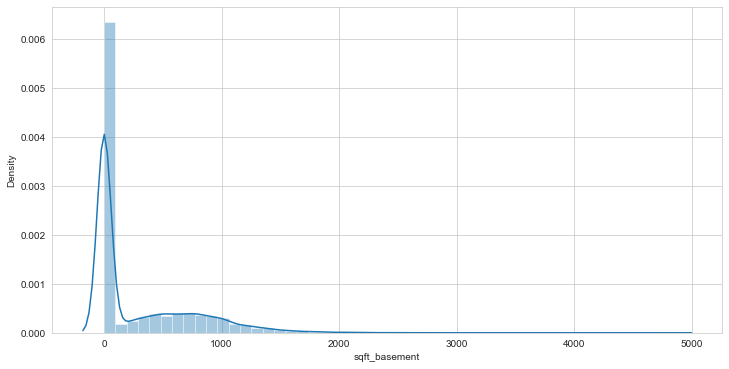

In [236]:
sns.distplot(df['sqft_basement']);

In [237]:
df['sqft_basement'].value_counts()

0       13110
600       221
700       218
500       214
800       206
        ...  
65          1
1248        1
172         1
1920        1
1135        1
Name: sqft_basement, Length: 306, dtype: int64

In [238]:
df[df["sqft_basement"] > 3000]

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,47.557,-122.210,3270,10454,0,0,0,0,0,1,0,0,0,0,0,0
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,1980,0,47.576,-122.242,4480,16471,0,0,0,0,0,0,0,0,1,0,0,0
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,1991,0,47.593,-122.086,4913,14663,0,0,0,0,0,0,0,1,0,0,0,0


could make sense due to scaling, higher should correlate to more value

### sqft_above

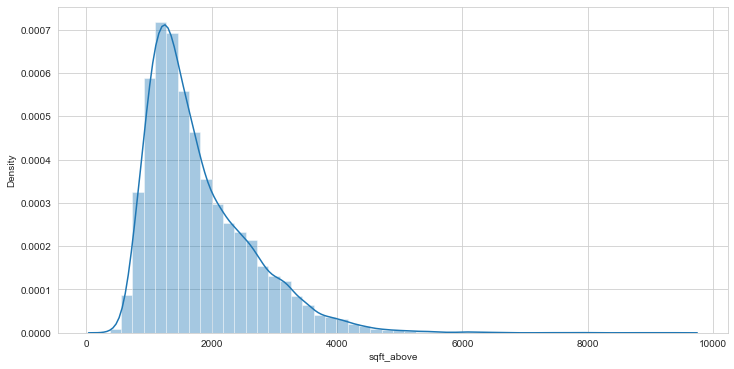

In [40]:
sns.distplot(df['sqft_above']);

In [41]:
df['sqft_above'].value_counts()

1300    212
1010    210
1200    206
1220    192
1140    184
       ... 
2198      1
6420      1
2406      1
2502      1
2031      1
Name: sqft_above, Length: 942, dtype: int64

In [239]:
df[df["sqft_above"] > 6000]

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
419,1550000.000,5,4.250,6070,171626,2.000,0,0,3,12,6070,0,1999,0,47.595,-121.950,4680,211267,0,0,0,0,0,0,1,0,0,0,0,0
527,1600000.000,6,5.000,6050,230652,2.000,0,3,3,11,6050,0,2001,0,47.603,-121.943,4210,233971,0,0,0,0,0,1,0,0,0,0,0,0
1099,1570000.000,5,4.500,6070,14731,2.000,0,0,3,11,6070,0,2004,0,47.531,-122.134,4750,13404,0,0,0,0,0,0,0,0,0,0,1,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0
2624,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,47.749,-122.280,3030,23408,0,0,0,0,0,0,0,1,0,0,0,0
3118,1320000.000,4,5.250,6110,10369,2.000,0,0,3,11,6110,0,2005,0,47.529,-122.135,4190,10762,0,0,0,0,0,0,0,0,0,0,1,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,47.629,-122.233,3560,24345,0,0,0,0,0,0,0,1,0,0,0,0
4807,2480000.000,5,3.750,6810,7500,2.500,0,0,3,13,6110,700,1922,0,47.629,-122.322,2660,7500,0,0,1,0,0,0,0,0,0,0,0,0
6495,1940000.000,4,5.750,7220,223462,2.000,0,4,3,12,6220,1000,2000,0,47.710,-122.013,2680,7593,0,1,0,0,0,0,0,0,0,0,0,0


### Geographical Properties

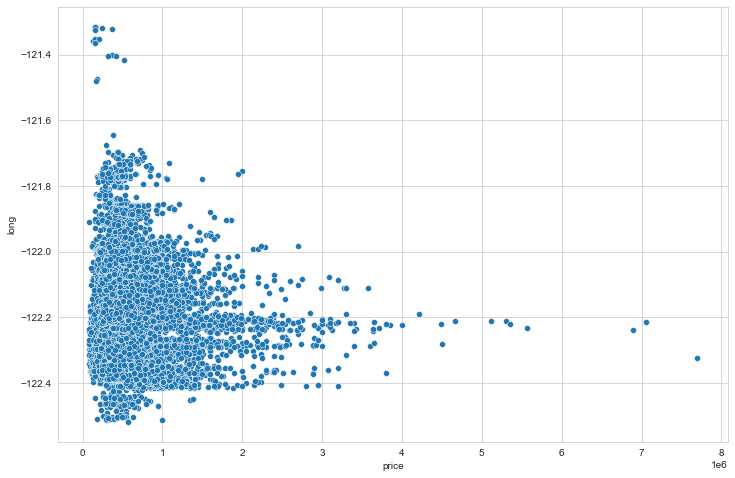

In [240]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

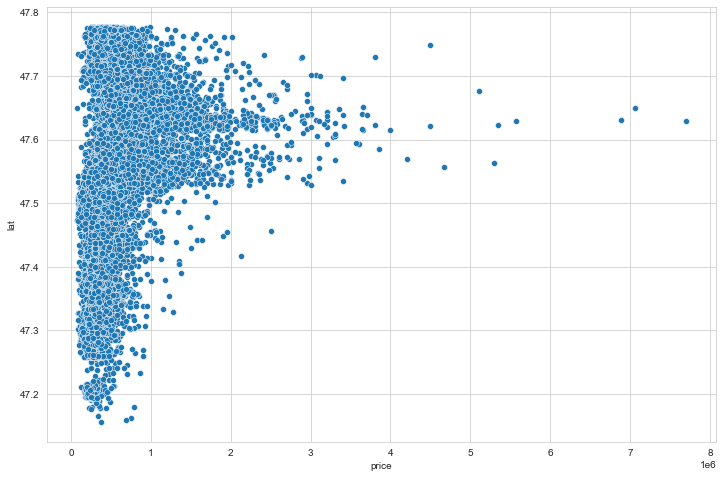

In [241]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);

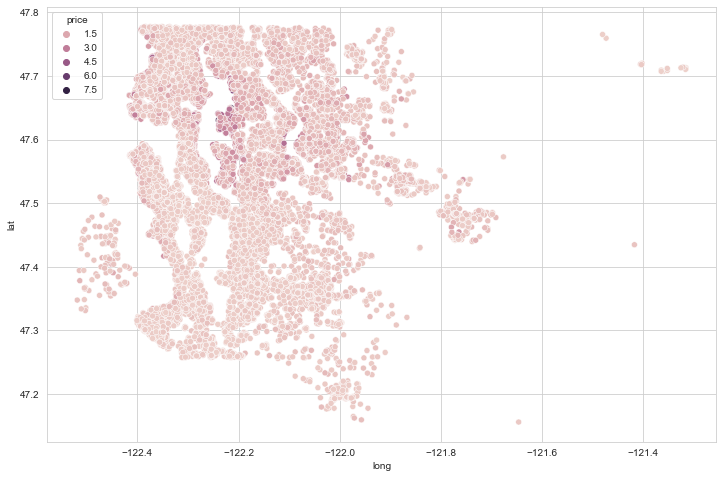

In [242]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price');

In [244]:
len(df) * (0.01)

# datamın %1 i 216 satıra denk geliyor.

215.96

In [245]:
# fiyatının yüksekliğine göre ilk 216 satırı getirdim.

df.sort_values('price', ascending = False).head(216)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,47.629,-122.233,3560,24345,0,0,0,0,0,0,0,1,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,2007,0,47.626,-122.291,2180,6037,0,0,0,0,0,0,1,0,0,0,0,0
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,1990,0,47.632,-122.192,2540,26287,0,1,0,0,0,0,0,0,0,0,0,0
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,2007,0,47.638,-122.219,2180,10800,0,0,0,0,0,0,0,1,0,0,0,0
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,1951,0,47.620,-122.212,2370,13320,0,1,0,0,0,0,0,0,0,0,0,0


In [248]:
# 216 dan sonrakileri bana getir. (yani fiyat olarak %1 lik kısım dışında kalanlar)

non_top_1_perc = df.sort_values('price', ascending = False).iloc[216:]
non_top_1_perc

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
17221,1970000.000,8,3.500,4440,6480,2.000,0,3,5,10,3140,1300,1959,0,47.631,-122.303,4440,8640,0,0,0,0,1,0,0,0,0,0,0,0
9166,1960000.000,3,1.750,3330,12566,1.000,1,4,4,8,1940,1390,1960,0,47.529,-122.220,3730,16560,0,1,0,0,0,0,0,0,0,0,0,0
12565,1960000.000,4,4.000,4430,31353,2.000,0,0,3,12,4430,0,1998,0,47.642,-122.157,3900,35237,0,0,0,1,0,0,0,0,0,0,0,0
1150,1960000.000,4,2.750,3120,7898,1.000,1,4,4,8,1560,1560,1963,0,47.717,-122.259,2630,13868,0,0,0,1,0,0,0,0,0,0,0,0
12271,1960000.000,5,4.500,6200,23373,3.000,0,1,4,11,5050,1150,1988,0,47.563,-122.215,3700,14486,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2139,82500.000,2,1.000,520,22334,1.000,0,0,2,5,520,0,1951,0,47.480,-122.296,1572,10570,0,0,0,0,1,0,0,0,0,0,0,0
8267,82000.000,3,1.000,860,10426,1.000,0,0,3,6,860,0,1954,0,47.499,-122.341,1140,11250,0,0,0,0,0,0,0,0,0,0,1,0
16184,81000.000,2,1.000,730,9975,1.000,0,0,1,5,730,0,1943,0,47.481,-122.315,860,9000,0,0,1,0,0,0,0,0,0,0,0,0
465,80000.000,1,0.750,430,5050,1.000,0,0,2,4,430,0,1912,0,47.650,-121.909,1200,7500,0,0,0,0,1,0,0,0,0,0,0,0


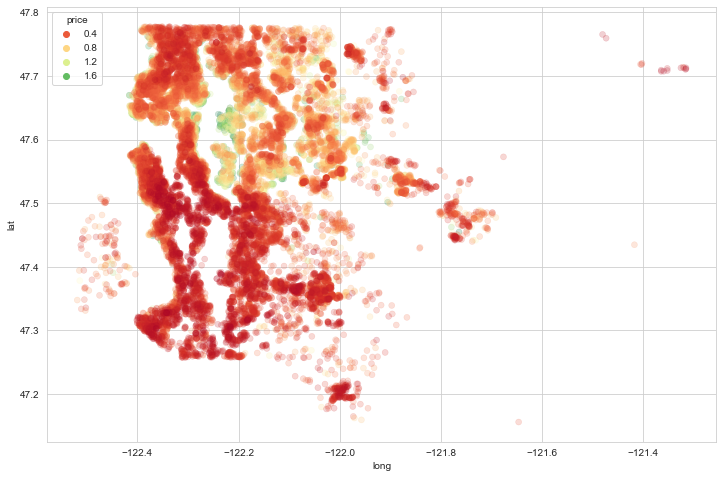

In [249]:
# fiyat olarak % 1 dışında kalanların scatterplotuna fiyatı hue'ye atayarak baktım.

plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);

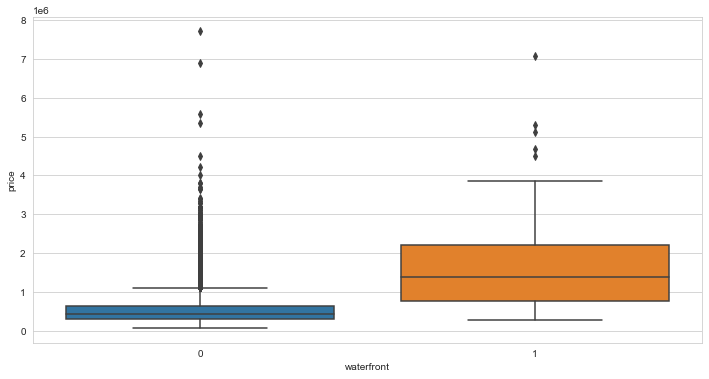

In [250]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);

In [251]:
# ! pip install folium

- sqft_living15 column ilgili eve en yakın 15 evin ortalama yaşam alanı
- zoom_start=10 Haritayı büyütüyor
-  bir adresten pandas ile nasil koordinat cikarilacagini anlatan makale
https://towardsdatascience.com/how-to-generate-lat-and-long-coordinates-from-an-address-column-using-pandas-and-googlemaps-api-d66b2720248d

In [122]:
# merkez location'ı lat ve long'un ortalamasını aldığımızdaki nokta olacak şekilde haritamı çizdirdim.

import folium
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

In [123]:
map_kc = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start = 10) # location=[47.511,  -122.257]
for lat, lng in zip(df['lat'], df['long']):
    folium.CircleMarker(
        [lat, lng],
        radius = 1,
        color = 'blue',
        fill = False ,
        fill_color ='#3186CC',
        fill_opacity = 0.3).add_to(map_kc)
map_kc

### latest data

In [252]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,47.721,-122.319,1690,7639,0,0,0,0,0,0,0,0,0,0,0,1
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,47.738,-122.233,2720,8062,0,1,0,0,0,0,0,0,0,0,0,0
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,47.521,-122.393,1360,5000,0,0,0,0,0,0,0,0,0,0,0,1
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,47.617,-122.045,1800,7503,0,1,0,0,0,0,0,0,0,0,0,0


In [253]:
df.shape

(21596, 30)

## Preprocessing of Data
- Train | Test Split, Scalling

In [124]:
from sklearn.model_selection import train_test_split

In [125]:
X = df.drop('price', axis = 1)
y = df['price']

In [126]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=101)

In [127]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.

In [128]:
scaler = MinMaxScaler()

In [129]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [130]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

In [131]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score

In [132]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [133]:
X_train.shape

(19436, 29)

In [134]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

model.compile(optimizer = 'adam', loss = 'mse')

- tüm katmanlardaki activation fonkiyonu aynı olmak zorunda değil, ama bir esas üzerinden gitmek mantıklı
- multiclass classification için softmax

In [135]:
# bunlar ilk olarak random atadığı ağırlıklar

model.weights

[<tf.Variable 'dense_25/kernel:0' shape=(29, 19) dtype=float32, numpy=
 array([[ 0.15974525, -0.1440506 ,  0.30467853,  0.32469317,  0.04734424,
         -0.13985555,  0.18410113,  0.06628031,  0.33816126, -0.10180596,
         -0.33238405, -0.0723438 , -0.23819241, -0.13325459,  0.06688821,
          0.01250228, -0.18216744,  0.16749611,  0.00073132],
        [ 0.12882057,  0.15873304,  0.31642225,  0.21520355, -0.2776206 ,
          0.07355812,  0.11645105,  0.13724902,  0.28374276, -0.10746215,
         -0.26249123,  0.32388225, -0.07103303, -0.05532303,  0.11137202,
          0.11809808, -0.16643865,  0.31737056, -0.25560224],
        [ 0.14728096, -0.17560603, -0.28316334,  0.30766943, -0.05374607,
         -0.18587822, -0.04339871,  0.19605878,  0.24396262,  0.05393809,
          0.21616957,  0.16164115, -0.27249   , -0.30856776,  0.16897067,
          0.2957205 , -0.12392649,  0.19328621,  0.34132388],
        [-0.32076043, -0.3311553 ,  0.17209932,  0.02163759, -0.08146507,
   

In [136]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 1s 2ms/step - loss: 428580929536.0000 - val_loss: 423787495424.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 424787312640.0000 - val_loss: 410764607488.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 376451170304.0000 - val_loss: 308525498368.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 211706576896.0000 - val_loss: 127550283776.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 103018029056.0000 - val_loss: 104847826944.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 96746651648.0000 - val_loss: 103094820864.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 94893948928.0000 - val_loss: 101446672384.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 93016571904.0000 - val_loss: 99620143104.0000
Epoch 9/1000

- history.history üzerinden grafik ile anlayabiliriz ne kadar epoch gerektiğini
- shuffle her epoch ta kalan kısmı farklı satıları seçerek alıyor

- validation_split, datanın sondaki yüzde 15 lik kısmını validate yapmak için ayırdı.
- eğitim için datamın geri kalanını kullanacak.
- her epochs'ta aynı son %15 lik bölümü ayırıyor. kalan kısmı karıştırıyor öyle modele sokuyor.

- ilk 5 epochta vall_lossun daha kucuk olmasinin nedeni aşamalı öğrenme, öğrenerek ilerliyor. backpro....

- her bach grubunda bir loss buluyor, her epochs iterasyonunda bir val_loss alıyor, kalan datayı karıştırıyor. dolayısı ile hepsi işleme alınıyor

- hocam shuffle yapılınca batchlerdeki satırlar karıştırılmış oluyor. val kısmı hariç hepsi giriyor. ama girmeden ince shuffle ile şöyle bir dağılıp toplanıyor

- datayı 128 lik paketler halinde (dolayısıyla 130 defada bir epochs iterasyonu tamamlanacak şekilde) modeli tekrar tekrar fit ediyor.
 her bir epochs iterasyonu için (validation_split ile ayırmış olduğu %15 lik bölüm üzerinden) val_loss değerlerini buluyor.
val_loss değerini 130. bach'te alıyor ve return de onu gösteriyor. o satırda gösterdiği loss değeri ise 130.bach'in loss değeri.
 (fakat her bach paket için loss alıyor)

In [137]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_25 (Dense)             (None, 19)                570       
_________________________________________________________________
dense_26 (Dense)             (None, 19)                380       
_________________________________________________________________
dense_27 (Dense)             (None, 19)                380       
_________________________________________________________________
dense_28 (Dense)             (None, 19)                380       
_________________________________________________________________
dense_29 (Dense)             (None, 1)                 20        
Total params: 1,730
Trainable params: 1,730
Non-trainable params: 0
_________________________________________________________________


In [138]:
model.weights

[<tf.Variable 'dense_25/kernel:0' shape=(29, 19) dtype=float32, numpy=
 array([[-3.01709175e-02, -7.28803515e-01, -6.83156729e-01,
          5.98534271e-02, -3.05266112e-01, -4.82794791e-01,
         -1.19203973e+00, -6.80783391e-01,  8.64466548e-01,
          5.81230402e-01, -7.21553802e-01, -3.16706240e-01,
          2.28697181e-01, -1.30171227e+00, -5.95475852e-01,
         -1.42044667e-02, -6.73393548e-01,  8.71111080e-02,
         -5.44620872e-01],
        [ 8.40176105e-01,  4.68102455e-01,  3.68426621e-01,
          1.47885609e+00,  6.02761269e-01,  9.41282570e-01,
          1.70599163e+00,  1.01428628e+00,  3.29049304e-02,
         -5.00971198e-01,  6.66810215e-01,  1.72228897e+00,
          7.44062901e-01,  1.94156265e+00,  2.46615723e-01,
          8.54801536e-02,  9.21043754e-01,  2.50095040e-01,
          8.99534464e-01],
        [ 2.41424894e+00,  7.96140850e-01, -2.12681845e-01,
          1.81184983e+00,  1.65891647e+00,  1.51250923e+00,
          2.33456397e+00,  1.596313

In [139]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,428580929536.000,423787495424.000
1,424787312640.000,410764607488.000
2,376451170304.000,308525498368.000
3,211706576896.000,127550283776.000
4,103018029056.000,104847826944.000
...,...,...
995,23216756736.000,28257130496.000
996,23154817024.000,28200458240.000
997,23093579776.000,28289570816.000
998,23019677696.000,28292573184.000


<AxesSubplot:>

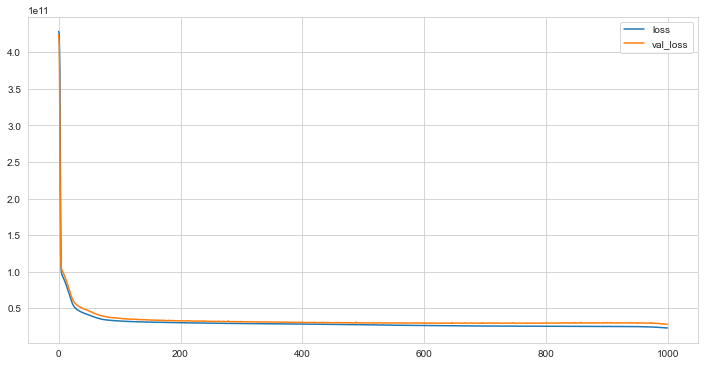

In [140]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [141]:
model.evaluate(X_test, y_test, verbose=0)

20188643328.0

In [142]:
y_pred = model.predict(X_test)

In [143]:
eval_metric(y_test, y_pred)

r2_score: 0.8428651747157886 
mae: 87528.58092086227 
mse: 20188644944.55038 
rmse: 142086.7514744087


### learning_rate

In [144]:
from tensorflow.keras.optimizers import Adam

In [145]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)  # lr=0.003 --> learning rate'in en uygun değerini defalarca deneye deneye bulduk.
model.compile(optimizer = opt, loss = 'mse')

# learning rate ile eğimi çarpıyorduk ve bu bize atacağımız adımın büyüklüğünü veriyordu.

In [146]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 425498476544.0000 - val_loss: 400108519424.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 223245369344.0000 - val_loss: 105272532992.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 94966939648.0000 - val_loss: 99643121664.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 89504940032.0000 - val_loss: 94123892736.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 83758465024.0000 - val_loss: 88235679744.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 77486579712.0000 - val_loss: 81963360256.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 70754820096.0000 - val_loss: 75312078848.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 63846256640.0000 - val_loss: 67772022784.0000
Epoch 9/1000
130/130

<AxesSubplot:>

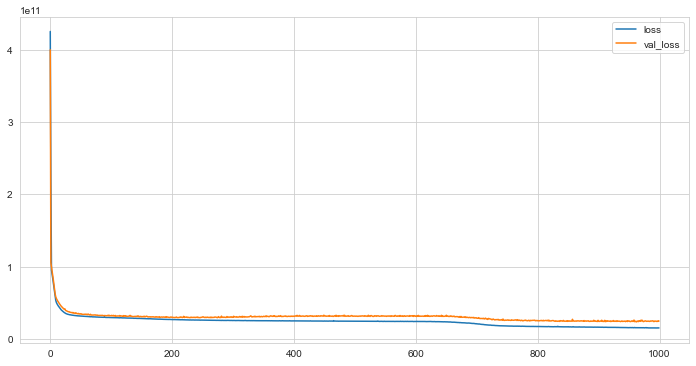

In [147]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [148]:
y_pred = model.predict(X_test)

In [149]:
eval_metric(y_test, y_pred)

r2_score: 0.8821342397513227 
mae: 73244.74592013888 
mse: 15143364817.290699 
rmse: 123058.37971178841


### EarlyStopping

In [157]:
from tensorflow.keras.callbacks import EarlyStopping

In [158]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [159]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

- patience= 25 : son 25 epochs ta skorda iyileşme olmazsa eğitimi durdur

- early_stopping yapmazsak train loss score düşerken val loss score sabit kalacağından overfitting'e gider modelimiz

In [160]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 425046638592.0000 - val_loss: 397983809536.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 220125396992.0000 - val_loss: 106058670080.0000
Epoch 3/1000
130/130 [==============================] - 0s 4ms/step - loss: 95291686912.0000 - val_loss: 99760537600.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 89588588544.0000 - val_loss: 94086930432.0000
Epoch 5/1000
130/130 [==============================] - 1s 4ms/step - loss: 83475873792.0000 - val_loss: 88044748800.0000
Epoch 6/1000
130/130 [==============================] - 0s 4ms/step - loss: 76795691008.0000 - val_loss: 81090854912.0000
Epoch 7/1000
130/130 [==============================] - 0s 4ms/step - loss: 69681799168.0000 - val_loss: 73491521536.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 62615494656.0000 - val_loss: 66773884928.0000
Epoch 9/1000
130/130

<AxesSubplot:>

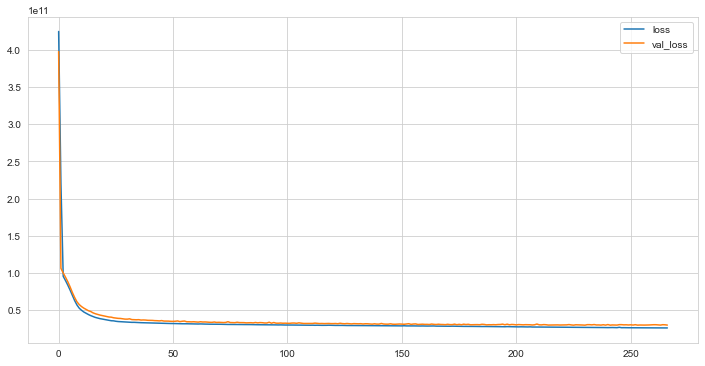

In [161]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [162]:
y_pred = model.predict(X_test)

In [163]:
eval_metric(y_test, y_pred)

r2_score: 0.8209604202027508 
mae: 95041.57957175926 
mse: 23002962589.67707 
rmse: 151667.27593544056


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

In [164]:
from tensorflow.keras.layers import Dropout

In [165]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dropout(0.2))   
model.add(Dense(19, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(19, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(19, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

# Dropout(0.2) : her seferinde öğrenen nöron saayısını belirlenen oranda (burada %20) azaltarak ve bunu random olarak yaparak 
# modelin ezberlemesini, dolayısıyla overfittinge girmesini engelliyoruz.

In [166]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

# patience= 25 : son 25 epochs ta skorda iyileşme olmazsa eğitimi durdur

In [167]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

# EarlyStopping in çalışması için callbacks=[early_stop] yazmalısın. (EarlyStopping in tanımlandığı değişkeni)

Epoch 1/1000
130/130 [==============================] - 1s 4ms/step - loss: 425394536448.0000 - val_loss: 396097290240.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 206746173440.0000 - val_loss: 105365929984.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 116704788480.0000 - val_loss: 98175197184.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 111951249408.0000 - val_loss: 91398152192.0000
Epoch 5/1000
130/130 [==============================] - 0s 3ms/step - loss: 102056255488.0000 - val_loss: 84286111744.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 94942068736.0000 - val_loss: 76271501312.0000
Epoch 7/1000
130/130 [==============================] - 0s 3ms/step - loss: 86188179456.0000 - val_loss: 68418482176.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 82021769216.0000 - val_loss: 63036162048.0000
Epoch 9/1000
130/

<AxesSubplot:>

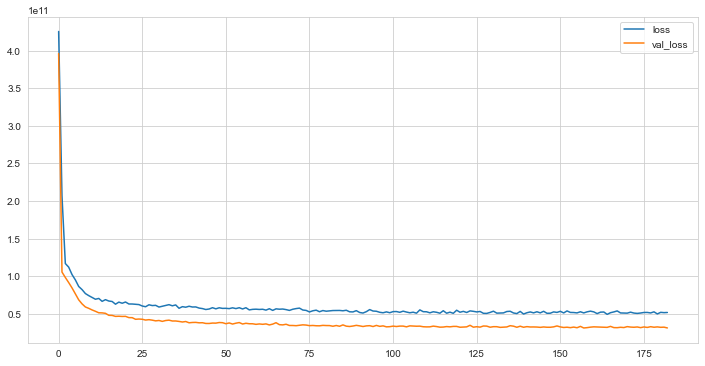

In [168]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [169]:
y_pred = model.predict(X_test)

In [170]:
eval_metric(y_test, y_pred)

r2_score: 0.8023613526719234 
mae: 100479.49382233796 
mse: 25392566358.29067 
rmse: 159350.45139029468


- hocam nöron sayısını modelden beklentimize göre belirlemiyor muyuz. bu sayıyı rastgele belirleyebiliyor muyuz?
- modelden beklentiden ziyade datanın karmaşıklığına göre belirliyoruz

- model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
- burası input layer değil. ilk hidden layer'a sana bu kadar input geliyor diyoruz.

## Saving Final Model and Scaler

In [171]:
import pickle
pickle.dump(scaler, open("scaler_kc_house", 'wb'))

In [172]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [173]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 1000)

# bu sefer datamı train setim ile eğiteyim ama validation'ı test setleri ile yapayım.
# çünkü tüm data seti ile train edersem validation'ı öğrendiği data ile yapmak zorunda kalırım.

# fakat bu final modelde önceki adımdaki modelden farkı, bu sefer train datamda %15 lik validation_split bölümü ayrılmamış. 
# yani önceki adıma göre yine fazla bir data ile eğitiyorum!

Epoch 1/1000
152/152 [==============================] - 1s 3ms/step - loss: 416870891520.0000 - val_loss: 338412568576.0000
Epoch 2/1000
152/152 [==============================] - 0s 2ms/step - loss: 147439271936.0000 - val_loss: 89359261696.0000
Epoch 3/1000
152/152 [==============================] - 0s 2ms/step - loss: 91507556352.0000 - val_loss: 80188727296.0000
Epoch 4/1000
152/152 [==============================] - 0s 3ms/step - loss: 81464467456.0000 - val_loss: 69606342656.0000
Epoch 5/1000
152/152 [==============================] - 0s 2ms/step - loss: 70051340288.0000 - val_loss: 58117447680.0000
Epoch 6/1000
152/152 [==============================] - 0s 2ms/step - loss: 59048902656.0000 - val_loss: 49439137792.0000
Epoch 7/1000
152/152 [==============================] - 0s 2ms/step - loss: 52263911424.0000 - val_loss: 45211430912.0000
Epoch 8/1000
152/152 [==============================] - 0s 2ms/step - loss: 48628740096.0000 - val_loss: 42712854528.0000
Epoch 9/1000
152/152 

<AxesSubplot:>

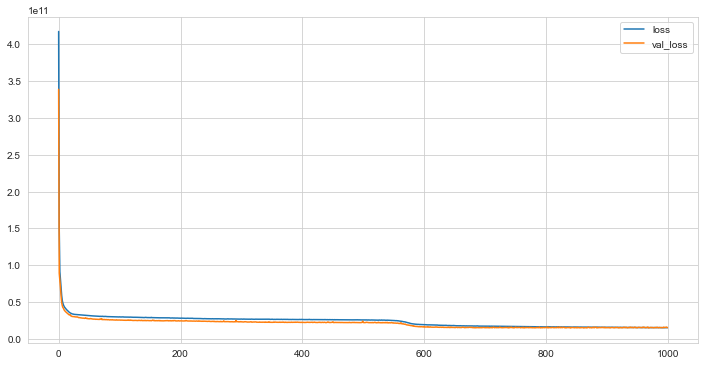

In [174]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [175]:
y_pred = model.predict(X_test)

In [176]:
eval_metric(y_test, y_pred)

r2_score: 0.8800853196269843 
mae: 75899.72485894097 
mse: 15406609587.093906 
rmse: 124123.36438839349


In [177]:
model.save('model_kc_house.h5')  # creates a HDF5 file 'my_model.h5'

## Loading Model and Scaler

In [178]:
from tensorflow.keras.models import load_model

In [179]:
model_kc_house = load_model('model_kc_house.h5')
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [180]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0


In [181]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.2       , 0.06666667, 0.06150342, 0.00307611, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.47826087, 0.        , 0.57149751, 0.21760797,
        0.15304348, 0.00573322, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 1.        , 0.        , 0.        ]])

In [182]:
model_kc_house.predict(single_house)

array([[251959.78]], dtype=float32)

In [183]:
df.iloc[0][0]

221900.0

## Comparison with ML

### Linear Regression

In [184]:
from sklearn.linear_model import LinearRegression 

In [254]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)

# neural ağ, linear regression'un 130 bin defa denenerek öğrenilmiş hali gibi (az önce 130 bin iterasyon yapmıştık)
# dolayısıyla %71'e ,%88 gibi ezici bir üstünlüğü olması normal.

r2_score: 0.716556796949612 
mae: 122256.83703703704 
mse: 36416715250.61574 
rmse: 190831.64111492553


### Random Forest

In [186]:
from sklearn.ensemble import RandomForestRegressor

In [187]:
rf_model = RandomForestRegressor(random_state = 101)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.8886293030442941 
mae: 64785.36375462963 
mse: 14308880631.643038 
rmse: 119619.73345415479
